<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/240216_FLR_RealWaste_EDA_und_klassische_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RealWaste mit klassischen ML-Methoden bearbeiten

## Installation der erforderlichen Bibliotheken und Import der relevanten Module

### Installation der erforderlichen Bibliotheken

In [1]:
!pip install tensorflow

In [2]:
!pip install Pillow

In [ ]:
!pip install seaborn

  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4


ERROR: Could not install packages due to an OSError: [WinError 5] Zugriff verweigert: 'C:\\ProgramData\\Anaconda3\\Lib\\site-packages\\~-mpy.libs\\libopenblas64__v0.3.23-293-gc2f4bdbb-gcc_10_3_0-2bde3a66a51006b2b53eb373ff767a3f.dll'
Consider using the `--user` option or check the permissions.



### Import der erforderlichen Module

In [3]:
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import cv2
import random

In [4]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier

## Datensatz laden und Bilder anzeigen/prüfen

### Datenverzeichnis einrichten

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


/content


In [38]:
# Ändern Sie diesen Pfad zu dem Ort, an dem sich Ihr RealWaste-Ordner befindet
# data_path = 'drive/mydrive/RealWaste'
%cd drive/MyDrive/RealWaste

/content/drive/MyDrive/RealWaste


In [39]:
# Überprüfen Sie den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

Current Directory: /content/drive/MyDrive/RealWaste


In [40]:
# Listen Sie die Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('.'))

Directory Contents: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


### Bilder anzeigen

In [41]:
pip install opencv-python-headless

Gib mir ein spezifisches, namentlich angegebenes Bild aus:

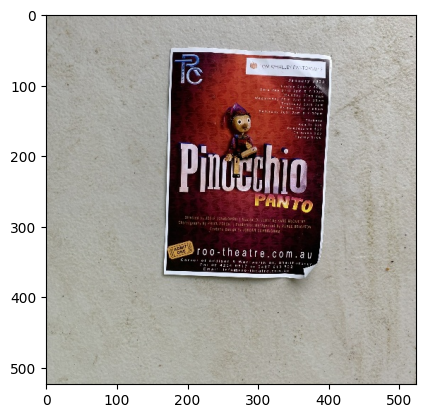

In [44]:
# Setzen Sie den vollständigen Pfad zum Bild hier ein
image_path = 'Paper/Paper_1.jpg'  # Ersetzen Sie 'name_des_bildes.jpg' mit einem tatsächlichen Bilddateinamen

# Überprüfen Sie, ob der Pfad existiert
if os.path.exists(image_path):
    # Bild laden
    image = cv2.imread(image_path)

    # Überprüfen Sie, ob das Bild korrekt geladen wurde
    if image is not None:
        # Konvertieren von BGR zu RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Bild anzeigen
        plt.imshow(image)
        plt.show()
    else:
        print("Das Bild konnte nicht geladen werden. Überprüfen Sie den Dateipfad und den Dateinamen.")
else:
    print(f"Der Pfad existiert nicht: {image_path}")


Gib mir das nte Bild aus dem Ordner 'Paper' aus, setze hierfür n

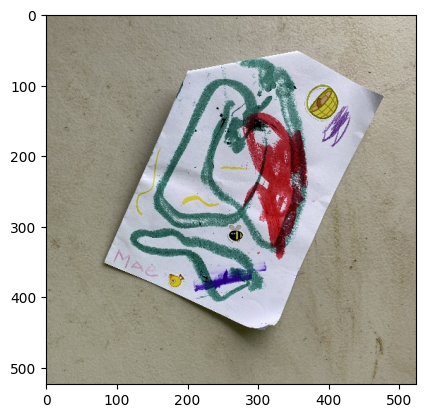

In [47]:
n = 15 # wird benötigt, um mir später das nte Bild im Ordner auszugeben.

# ---------------------

# Pfad zum Klassenordner
folder_path = 'Paper'

# Alle Dateien im Verzeichnis auflisten
files = os.listdir(folder_path)

# Stellen Sie sicher, dass mindestens fünf Bilder vorhanden sind
if len(files) >= 5:
    # Das fünfte Bild in der Liste auswählen
    fifth_file = files[n]  # Indexierung beginnt bei 0, also ist 4 das fünfte Element

    # Vollständigen Pfad zur Datei erstellen
    image_path = os.path.join(folder_path, fifth_file)

    # Bild laden
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konvertieren von BGR zu RGB

    # Bild anzeigen
    plt.imshow(image)
    plt.show()
else:
    print("Es gibt nicht genug Bilder im Verzeichnis.")

## Datenexploration

### Anzahl Bilder pro Klasse zählen und visualisieren

In [58]:
data_path = '.' # beziehe dich auf den aktuellen Ordnerpfad mit '.'.
# Der korrekte Ordnerpfad wurde bereits weiter oben ausgewählt.

# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Statistiken initialisieren
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' has {count} images")

Class 'Cardboard' has 461 images
Class 'Food Organics' has 411 images
Class 'Glass' has 420 images
Class 'Metal' has 790 images
Class 'Miscellaneous Trash' has 495 images
Class 'Paper' has 500 images
Class 'Plastic' has 921 images
Class 'Textile Trash' has 318 images
Class 'Vegetation' has 436 images


### Visualisierung des Zwischenergebnisses

<ipython-input-50-9e44ff841c7d>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=image_counts, y=class_names, palette="viridis")


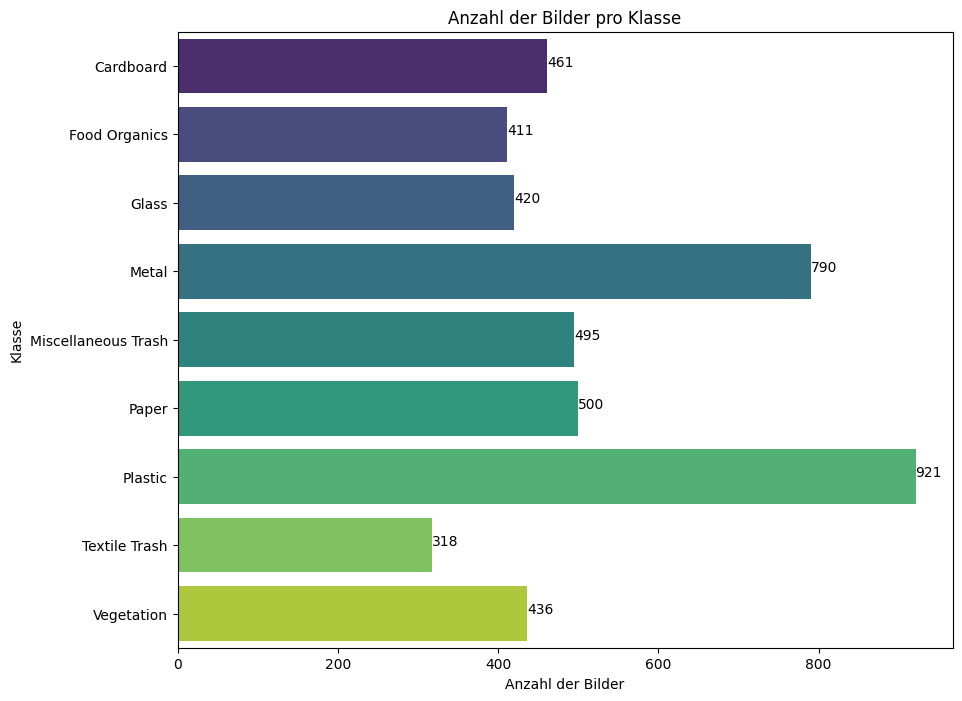

In [50]:
# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Beschriftungen hinzufügen
for index, value in enumerate(image_counts):
    plt.text(value, index, str(value))

plt.show()

#### Zeige mir beispielhaft je 3 Bilder pro Klasse an

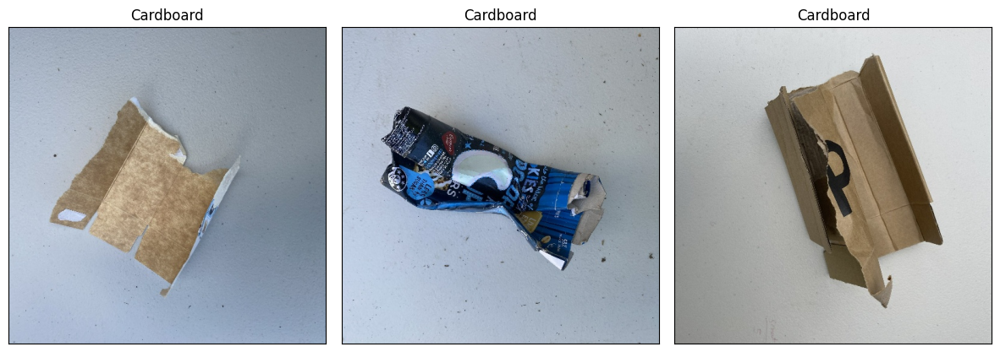

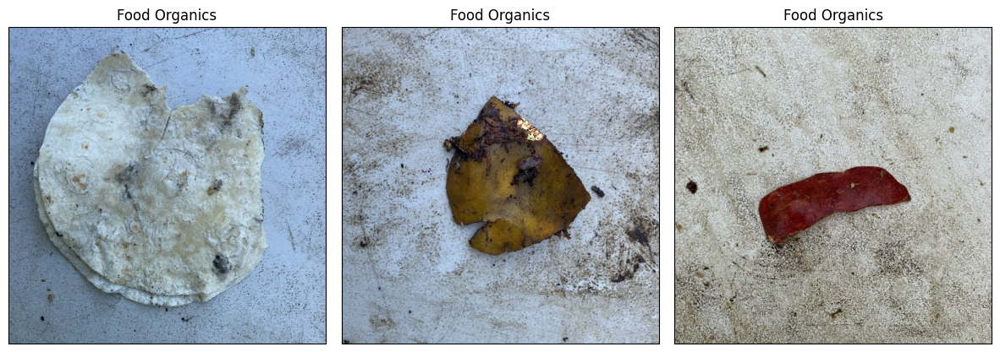

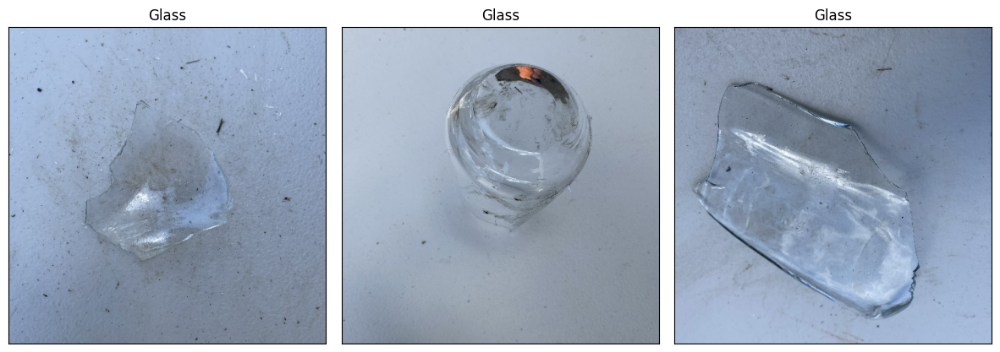

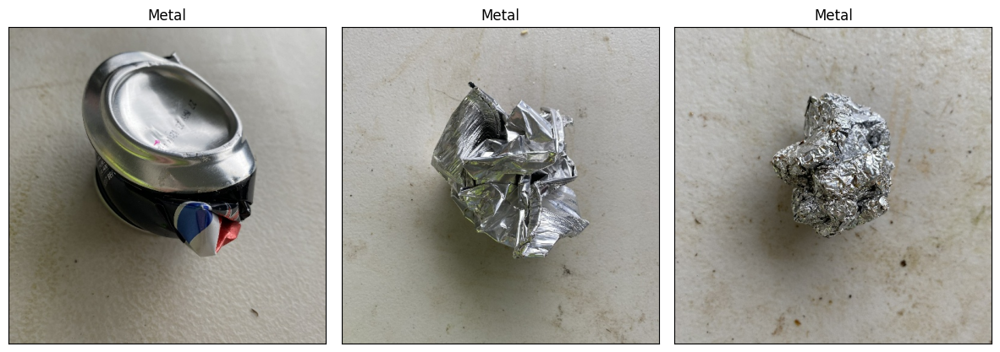

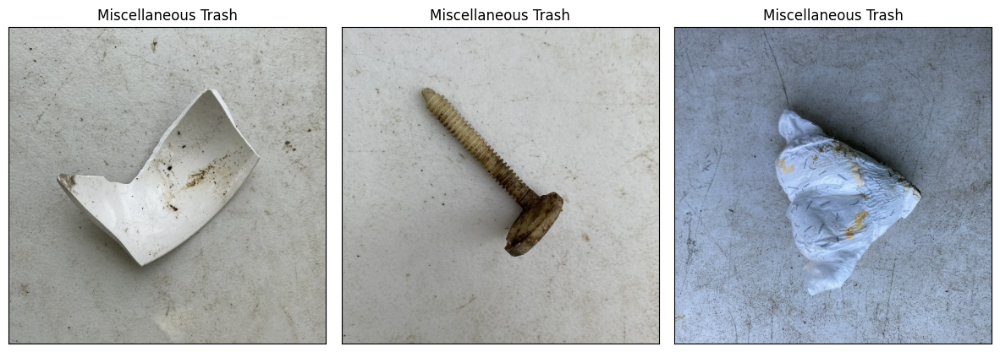

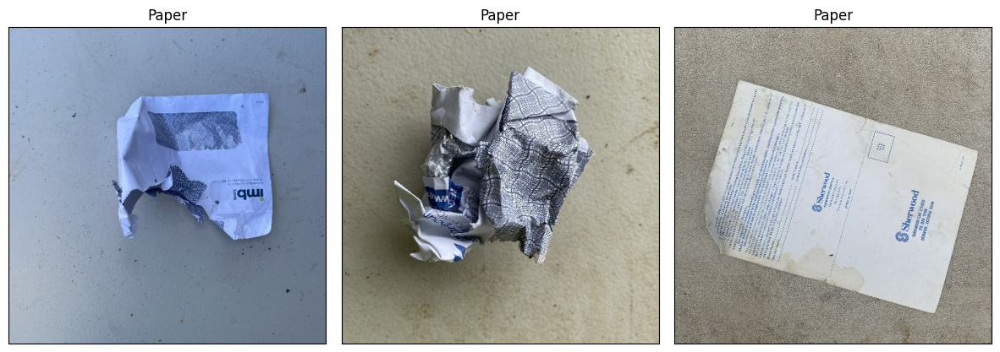

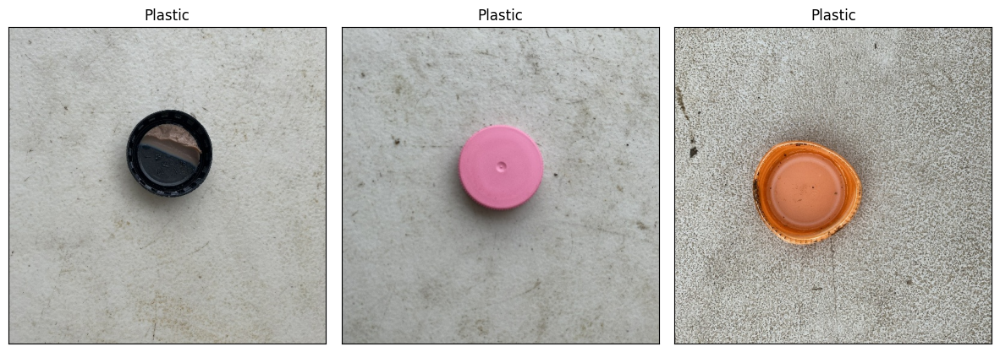

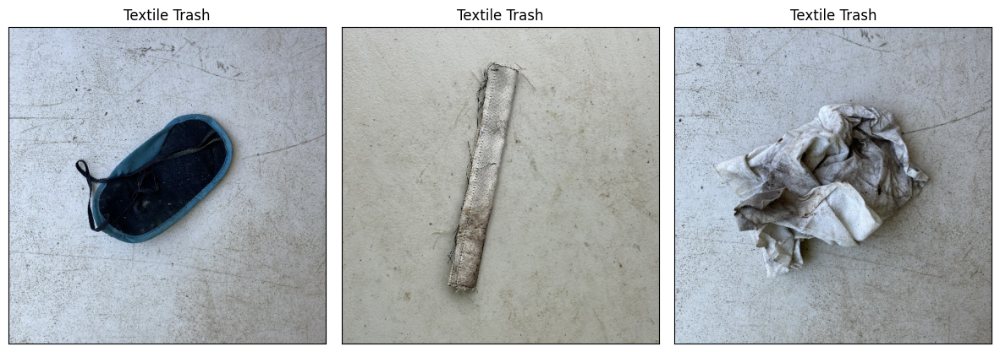

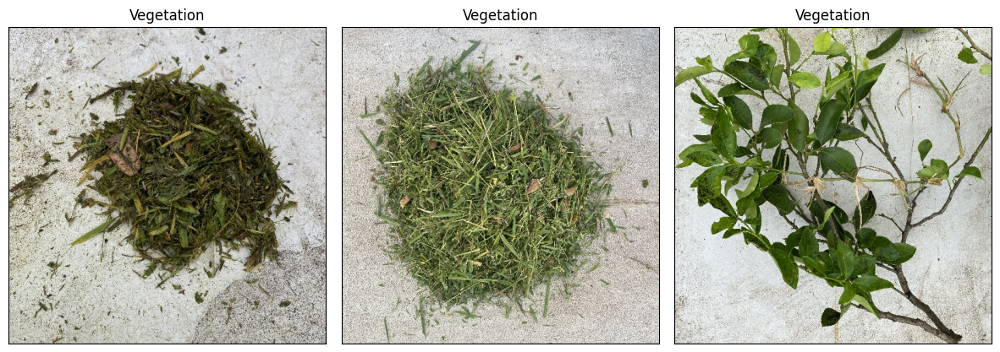

In [51]:
def display_images_from_each_class(data_path, num_images=3):
    classes = os.listdir(data_path)
    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        selected_images = random.sample(images, min(len(images), num_images))
        fig, axes = plt.subplots(1, min(len(images), num_images), figsize=(5*num_images, 5), subplot_kw={'xticks':[], 'yticks':[]})
        fig.subplots_adjust(hspace=0.3, wspace=0.05)
        for ax, image_name in zip(axes.flat, selected_images):
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.set_title(class_name)
        plt.show()

display_images_from_each_class(data_path)

#### Verteilung der Bildgrößen analysieren

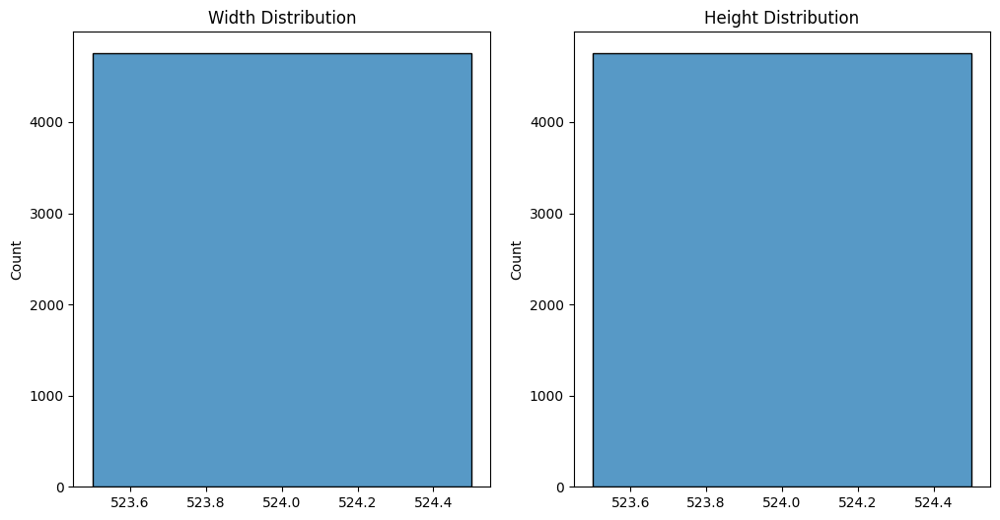

In [59]:
def plot_image_size_distribution(data_path):
    sizes = []
    for class_name in os.listdir(data_path):
        class_path = os.path.join(data_path, class_name)
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            image = Image.open(image_path)
            sizes.append(image.size)

    # Extract width and height
    widths, heights = zip(*sizes)

    # Plot distribution
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(widths)
    plt.title('Width Distribution')
    plt.subplot(1, 2, 2)
    sns.histplot(heights)
    plt.title('Height Distribution')
    plt.show()

plot_image_size_distribution(data_path)

#### Farbverteilung / Farbhistogramm für die Klassen

Dieser Code lädt ein zufälliges Bild aus jedem Klassenordner und erstellt dann ein Histogramm, das die Verteilung der Intensitätswerte für jeden Farbkanal (Rot, Grün, Blau) zeigt.

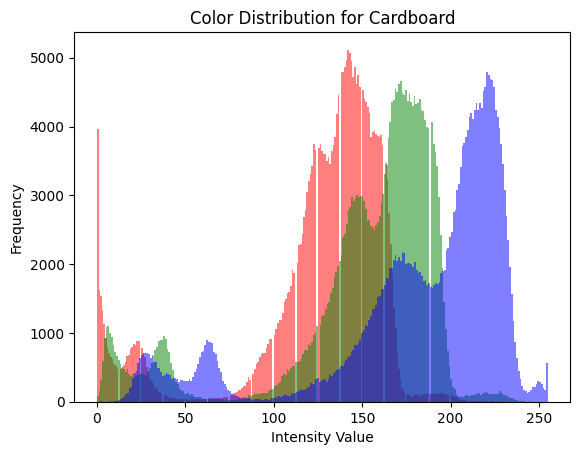

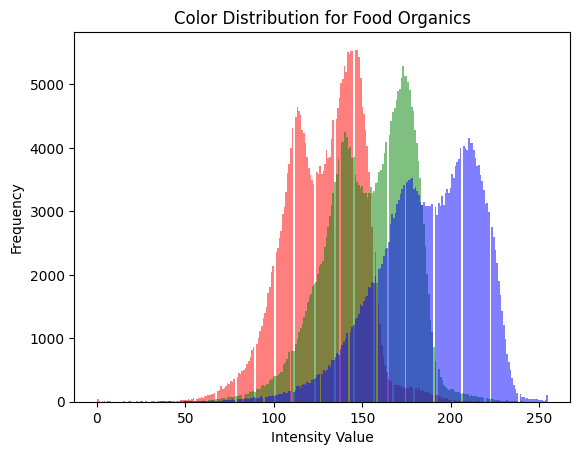

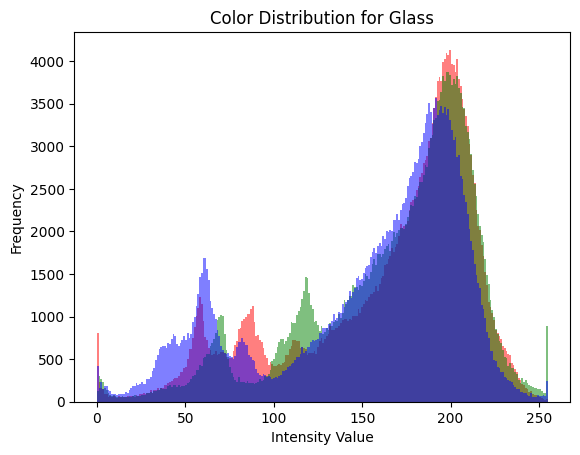

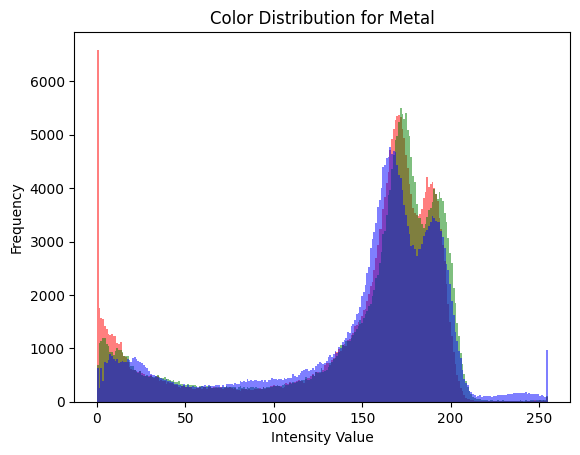

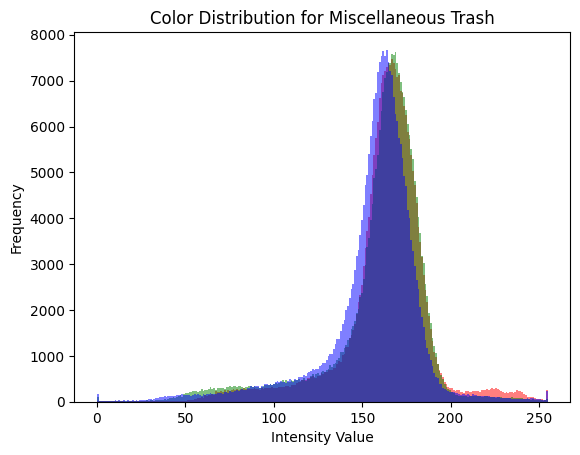

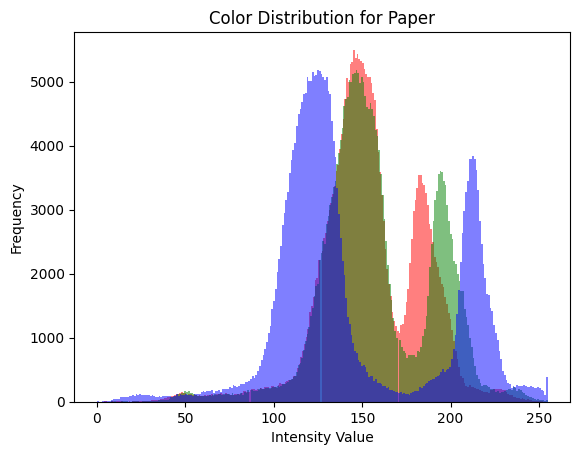

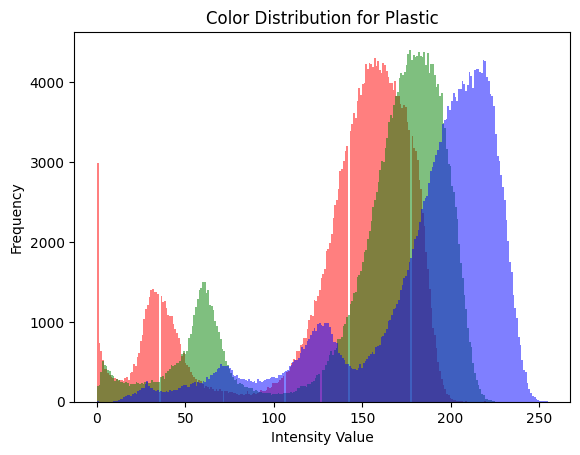

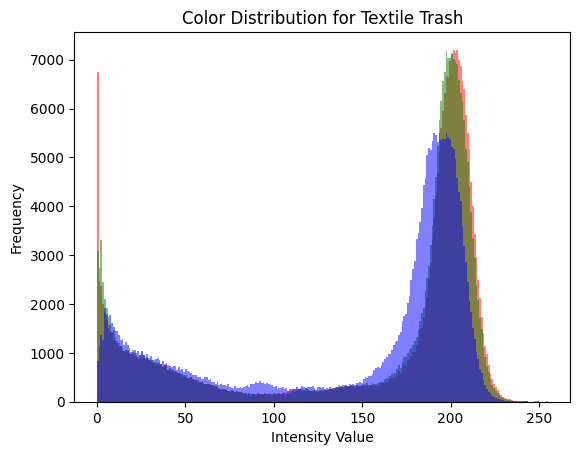

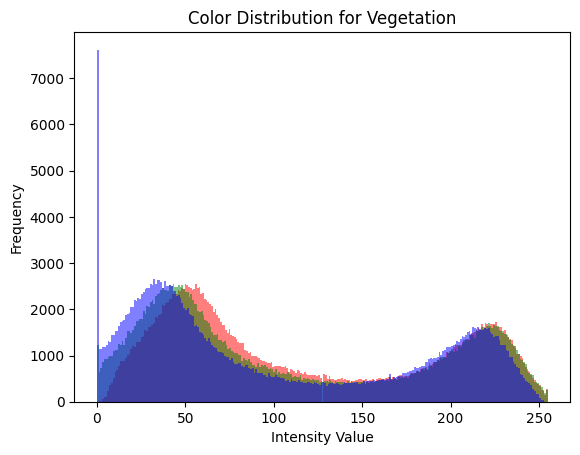

In [53]:
def plot_color_distribution(data_path, num_images=1):
    classes = os.listdir(data_path)
    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if len(images) > 0:
            selected_images = random.sample(images, min(len(images), num_images))
            for image_name in selected_images:
                image_path = os.path.join(class_path, image_name)
                image = cv2.imread(image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Flatten the image color channels into a list
                r, g, b = cv2.split(image)
                r = r.flatten()
                g = g.flatten()
                b = b.flatten()

                # Plotting
                fig, ax = plt.subplots()
                ax.hist(r, bins=256, color='red', alpha=0.5)
                ax.hist(g, bins=256, color='green', alpha=0.5)
                ax.hist(b, bins=256, color='blue', alpha=0.5)

                ax.set_xlabel('Intensity Value')
                ax.set_ylabel('Frequency')
                ax.set_title(f'Color Distribution for {class_name}')

                plt.show()

plot_color_distribution(data_path)

Jetzt für alle Bilder in allen Ordnern bzw. für alle Klassen

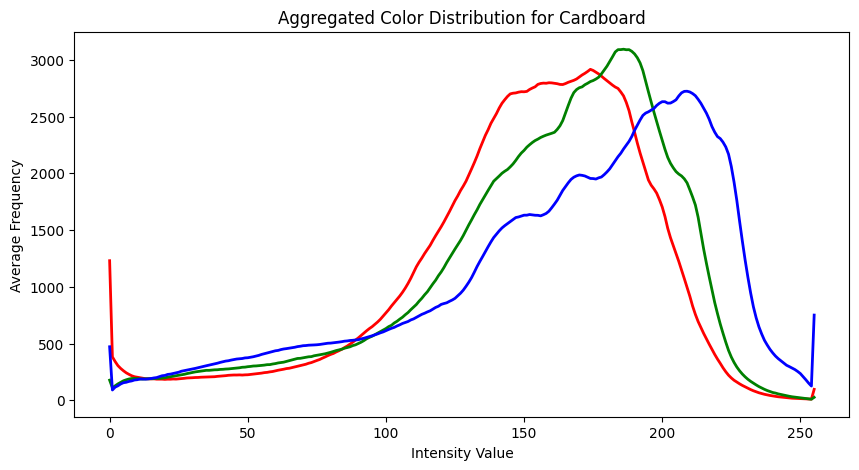

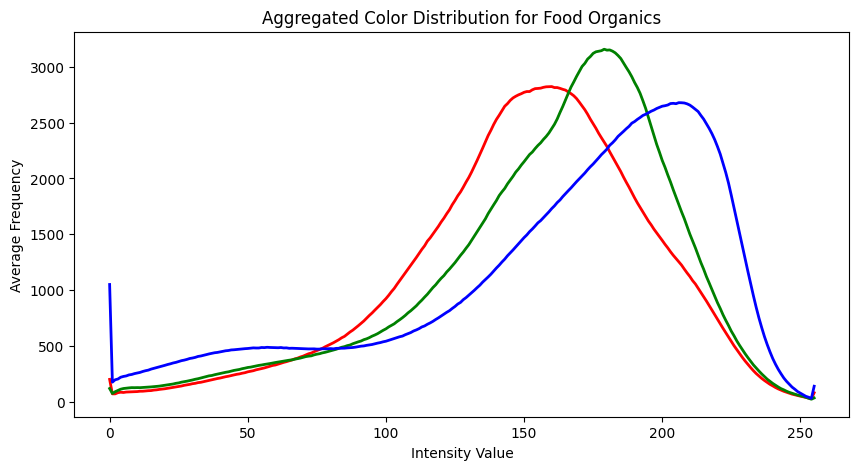

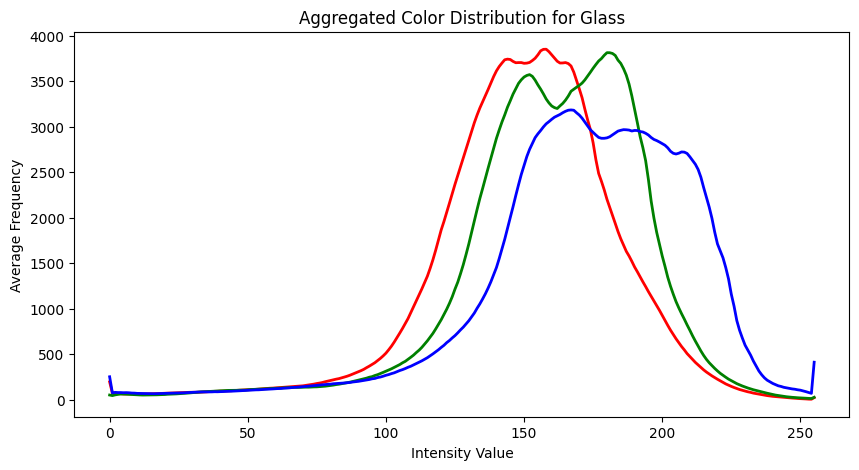

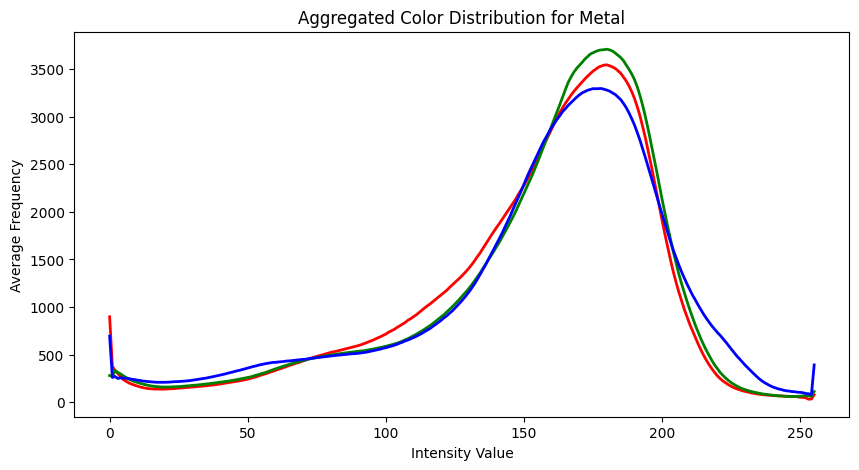

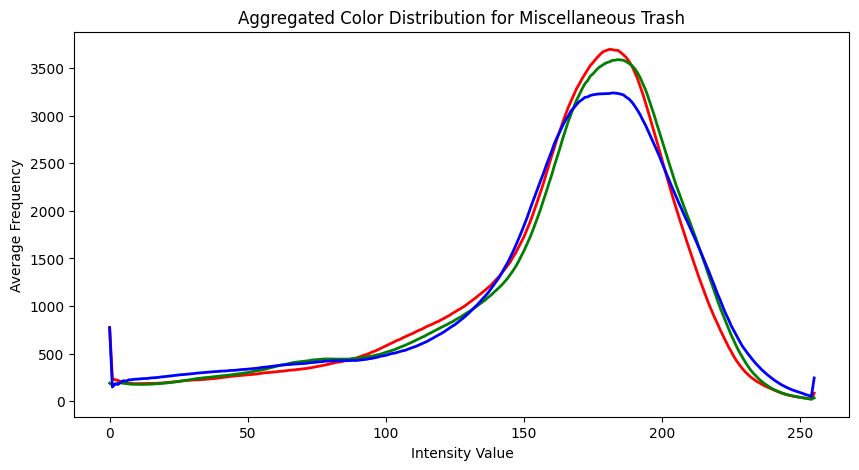

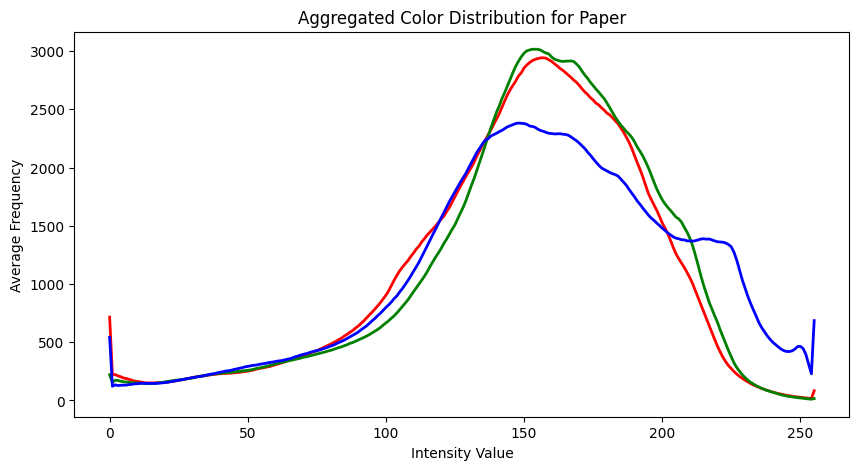

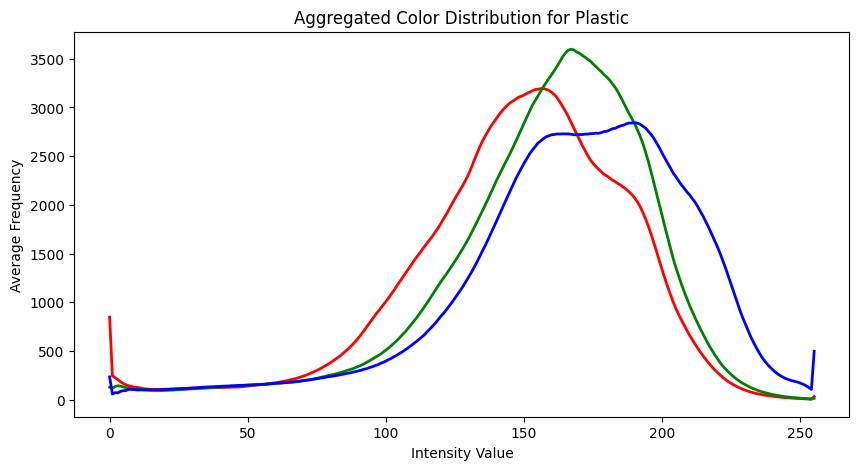

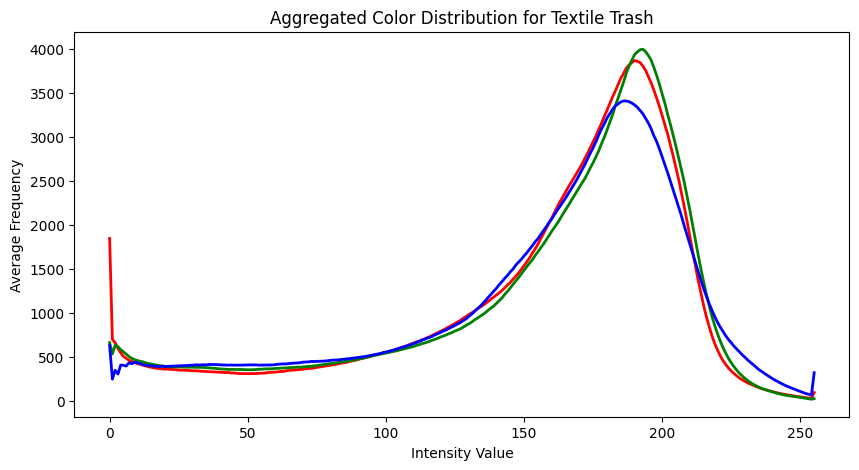

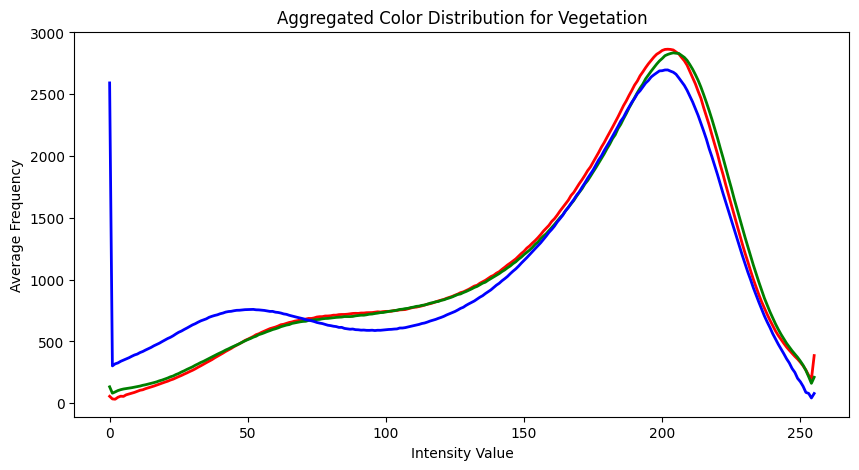

In [60]:
def plot_aggregated_color_distribution(data_path):
    classes = os.listdir(data_path)

    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Aggregate color channels
        aggregated_r = np.zeros(256)
        aggregated_g = np.zeros(256)
        aggregated_b = np.zeros(256)

        for image_name in images:
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            r, g, b = cv2.split(image)

            # Sum up the histograms for each color channel
            aggregated_r += np.histogram(r, bins=256, range=(0, 256))[0]
            aggregated_g += np.histogram(g, bins=256, range=(0, 256))[0]
            aggregated_b += np.histogram(b, bins=256, range=(0, 256))[0]

        # Normalize the histograms
        aggregated_r /= len(images)
        aggregated_g /= len(images)
        aggregated_b /= len(images)

        # Plotting
        plt.figure(figsize=(10, 5))
        plt.plot(aggregated_r, color='red', lw=2)
        plt.plot(aggregated_g, color='green', lw=2)
        plt.plot(aggregated_b, color='blue', lw=2)
        plt.title(f'Aggregated Color Distribution for {class_name}')
        plt.xlabel('Intensity Value')
        plt.ylabel('Average Frequency')
        plt.show()

plot_aggregated_color_distribution(data_path)

#### Principal Comonent Analysis (PCA) für die Klassen

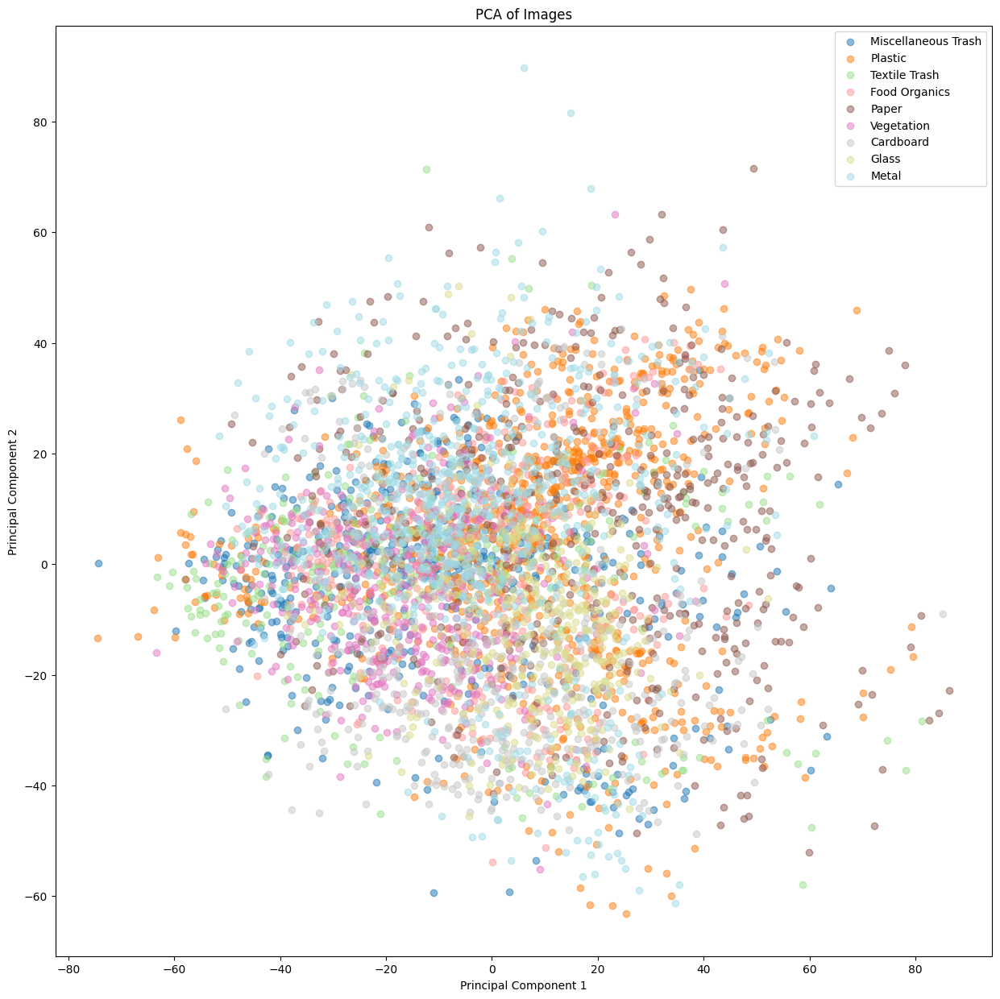

In [61]:
# Eine Liste zur Speicherung der Bilddaten und Labels vorbereiten
image_data = []
labels = []

# Größe, auf die alle Bilder gebracht werden
img_size = (64, 64)

# Bilder laden und vorverarbeiten
for class_name in os.listdir(data_path):
    class_path = os.path.join(data_path, class_name)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            # Bild laden
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            # Bildgröße ändern
            img = cv2.resize(img, img_size)
            # Bild zu einem Vektor flatten
            img_flattened = img.flatten()
            # Bilder und Labels in die Listen einfügen
            image_data.append(img_flattened)
            labels.append(class_name)

# Daten normalisieren
scaler = StandardScaler()
image_data_scaled = scaler.fit_transform(image_data)

# PCA durchführen
pca = PCA(n_components=2)  # Wir reduzieren auf 2 Komponenten
principal_components = pca.fit_transform(image_data_scaled)

# Ergebnisse plotten
plt.figure(figsize=(15, 15))
cmap = plt.get_cmap('tab20')
colors = [cmap(i) for i in np.linspace(0, 1, len(set(labels)))]
for i, class_name in enumerate(set(labels)):
    indices = [j for j, label in enumerate(labels) if label == class_name]
    plt.scatter(principal_components[indices, 0], principal_components[indices, 1], color=colors[i], alpha=0.5, label=class_name)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Images')
plt.legend()
plt.show()